## Họ tên: Nguyễn Phú Thành, MSSV: 18110014
## Bài tập thực hành Biến hình và xử lý ảnh - Lab 03

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import cv2
import os
from PIL import Image
from skimage.segmentation import watershed
from skimage import data, io, segmentation, color
from skimage.future import graph
from skimage.filters import threshold_otsu, rank as skiRank
from skimage.morphology import disk as skiDisk
from skimage.measure import label as skiLabel, regionprops
from skimage.transform import rescale, resize
from skimage.feature import peak_local_max
from scipy import ndimage as ndi

In [2]:
def imShows(Images, Labels = None, rows = 1, cols = 1):
    imagesArray = list(Images)
    labelsArray = [f"Image {i + 1}" for i in range(len(imagesArray))] if Labels is None else list(Labels)
    figsize = (14, 12) if ((rows == 1) and (cols == 1)) else (cols * 8, rows * 5)
    fig = plt.figure(figsize = figsize)
    for i in range(1, rows * cols + 1):
        ax = fig.add_subplot(rows, cols, i)
        image = imagesArray[i - 1]
        cmap = plt.cm.gray if (len(image.shape) < 3) else None
        ax.imshow(image, cmap = cmap)
        ax.set(title = labelsArray[i - 1], xticks = [], yticks = [])
    plt.show()

In [3]:
def fromDirectory(path, extension = '.jpg'):
    current_path = os.getcwd()
    os.chdir(path)
    
    image_dicts = dict()
    
    for file in os.listdir():
        if file.endswith(extension):
            image_dicts.setdefault(file, 0)
            if extension == '.png':
                with Image.open(file) as img:
                    image_dicts[file] = np.asarray(img.convert('RGB'))
            else:
                image_dicts[file] = plt.imread(file)
    os.chdir(current_path)
    return image_dicts

In [4]:
def ResizeImage(IM, DesiredWidth, DesiredHeight):
    OrigWidth = float(IM.shape[1])
    OrigHeight = float(IM.shape[0])
    Width = DesiredWidth 
    Height = DesiredHeight

    if((Width == 0) & (Height == 0)):
        return IM
    
    if(Width == 0):
        Width = int((OrigWidth * Height)/OrigHeight)

    if(Height == 0):
        Height = int((OrigHeight * Width)/OrigWidth)

    dim = (Width, Height)
    resizedIM = cv2.resize(IM, dim, interpolation = cv2.INTER_NEAREST) 
    return resizedIM

In [5]:
def segmentColorImageByMask(img, mask):        
    mask = mask.astype(np.uint8)    
    result = cv2.bitwise_and(img, img, mask = mask)    
    return result

def SegmentationByOtsu(image, mask):
    image_process = image.copy()
    image_mask = mask.copy()
    
    image_process[image_mask == 0] = 0
    ListPixel = image_process.ravel()
    ListPixel = ListPixel[ListPixel > 0]

    otsu_thresh = threshold_otsu(ListPixel)
    
    return otsu_thresh

In [6]:
def KMeansClustering(img, max_iteration = 10, epsilon = 1.0, number_clusters = 3):
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, max_iteration, epsilon)
    vectorized_img = img.reshape((-1, len(img.shape))).astype(np.float32)
    ret, label, center = cv2.kmeans(
        vectorized_img, 
        number_clusters, 
        None, 
        criteria, 
        max_iteration, 
        cv2.KMEANS_PP_CENTERS
    )
    result_label = label.reshape(img.shape[:2])
    result_img = center.astype(np.uint8)[label.flatten()].reshape(img.shape)
    
    return center.astype(np.uint8), result_label, result_img

In [7]:
def fillHoles(mask):
    result = ndi.binary_fill_holes(mask)
    return result

In [8]:
def ReArrangeIndex(image_index):
    AreaList = []
    for idx in range(image_index.max() + 1):
        mask = image_index == idx
        AreaList.append(mask.sum().sum())
    sort_index = np.argsort(AreaList)[::-1]
    index = 0
    image_index_rearrange = image_index * 0
    for idx in sort_index:
        image_index_rearrange[image_index == idx] = index
        index = index + 1
    return image_index_rearrange

In [9]:
def SelectLargestRegion(Mask):
    mask = Mask.copy()
    mask_output = mask * 0
    label_img = skiLabel(mask)
    regions = regionprops(label_img)
    max_area = 0
    ilabel = 0
    for props in regions:
        area = props.area
        if(area > max_area):
            max_area = area
            ilabel = props.label
    mask_output = mask_output + (label_img == ilabel).astype(int)
    return mask_output

In [10]:
image_dicts = dict()

for ext in ['.jpg', '.jpeg', '.png']:
    imgs = fromDirectory('Object Segmentation Data', extension = ext)
    image_dicts.update(imgs)

## WaterShed Segmentation

In [11]:
img_orig = image_dicts['Fire.jpg']
img = ResizeImage(img_orig, 300, 0)
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCR_CB)

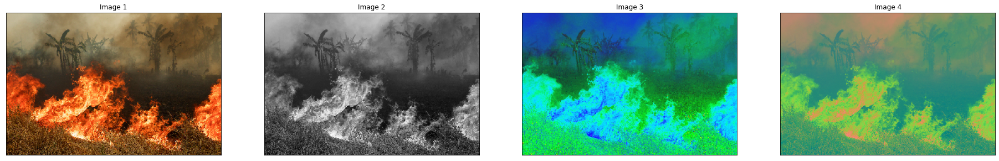

In [12]:
imShows([img, img_gray, img_hsv, img_ycrcb], rows = 1, cols = 4)

In [13]:
center, result_label, result_image = KMeansClustering(img, number_clusters = 3)
result_label = ReArrangeIndex(result_label)

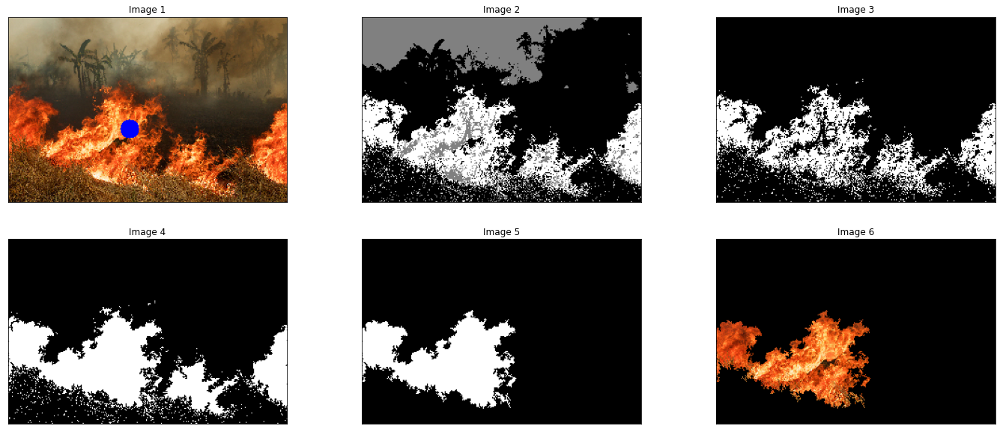

In [14]:
rpoint = 120
cpoint = 130
img_select = img.copy()
cv2.circle(img_select, (cpoint, rpoint), 10, (0, 0, 255), -1)

idx = result_label[rpoint, cpoint]
orig_mask = result_label == idx
fill_mask = fillHoles(orig_mask)
max_mask = SelectLargestRegion(fill_mask)
image_max_mask = segmentColorImageByMask(img, max_mask)

imShows([img_select, result_label, orig_mask, fill_mask, max_mask, image_max_mask], rows = 2, cols = 3)

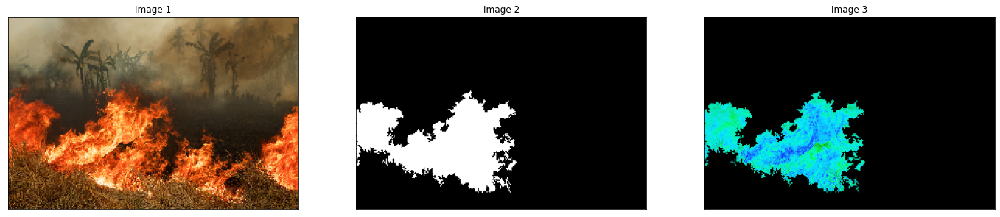

In [15]:
image_to_process = segmentColorImageByMask(img_hsv, max_mask)
mask_to_process = max_mask.copy()
imShows([img, mask_to_process, image_to_process], rows = 1, cols = 3)

In [16]:
image = image_to_process[:,:,0].copy()
distance = ndi.distance_transform_edt(image)
local_maxi = peak_local_max(distance, indices=False, footprint=np.ones((3, 3)), labels=image)
markers = ndi.label(local_maxi)[0]
labels = watershed(-distance, markers, mask=image)

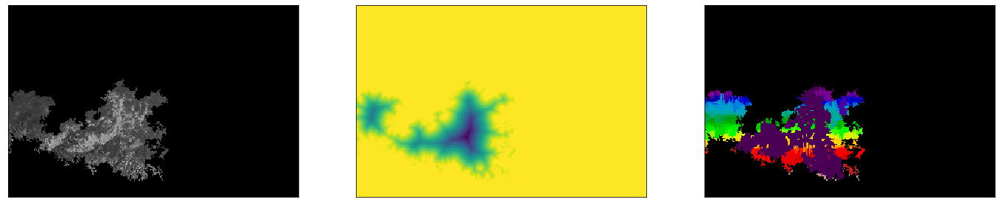

In [17]:
fig, axes = plt.subplots(figsize = (24, 5), nrows = 1, ncols = 3)

for i, (img_, cmap) in enumerate(zip([image, -distance, labels], ['gray', None, 'nipy_spectral'])):
    axes[i].imshow(img_, cmap = cmap, interpolation = 'nearest')
    axes[i].set(xticks = [], yticks = [])

### Segment tất cả vị trí lửa trong hình và sau đó trích các phần của lửa - tâm lửa và không phải tâm lửa

In [18]:
center, result_label, result_image = KMeansClustering(img_ycrcb, number_clusters = 3)
result_label = ReArrangeIndex(result_label)

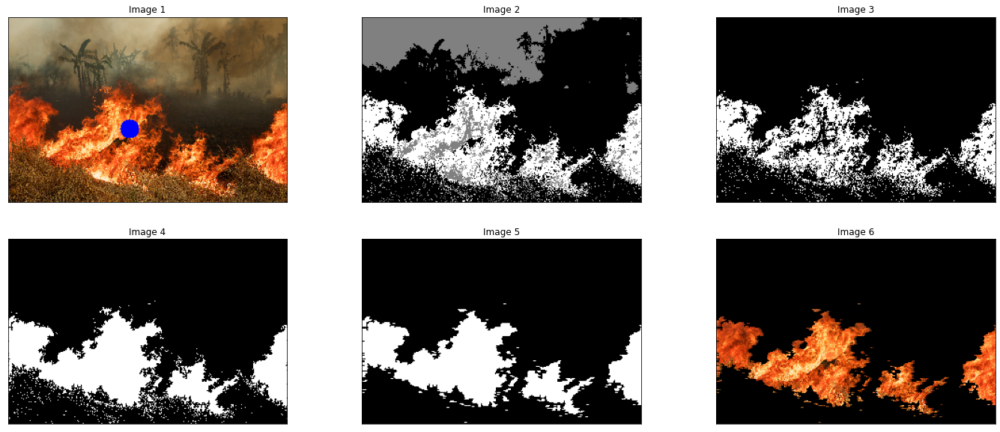

In [19]:
rpoint = 120
cpoint = 130
img_select = img.copy()
cv2.circle(img_select, (cpoint, rpoint), 10, (0, 0, 255), -1)

idx = result_label[rpoint, cpoint]
orig_mask = result_label == idx
fill_mask = fillHoles(orig_mask)
morph_mask = cv2.morphologyEx(fill_mask.astype(np.uint8), cv2.MORPH_OPEN, np.ones((1, 2)), iterations = 2)
image_morph_mask = segmentColorImageByMask(img, morph_mask)

imShows([img_select, result_label, orig_mask, fill_mask, morph_mask, image_morph_mask], rows = 2, cols = 3)

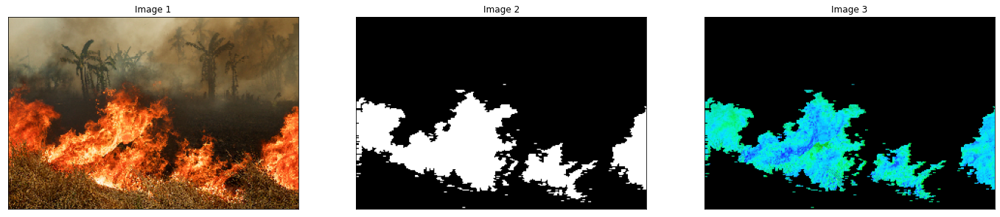

In [20]:
image_to_process = segmentColorImageByMask(img_hsv, morph_mask)
mask_to_process = morph_mask.copy()
imShows([img, mask_to_process, image_to_process], rows = 1, cols = 3)

In [21]:
image = image_to_process[:,:,0].copy()
distance = ndi.distance_transform_edt(image)
local_maxi = peak_local_max(distance, indices=False, footprint=np.ones((3, 3)), labels=image)
markers = ndi.label(local_maxi)[0]
labels = watershed(-distance, markers, mask=image)

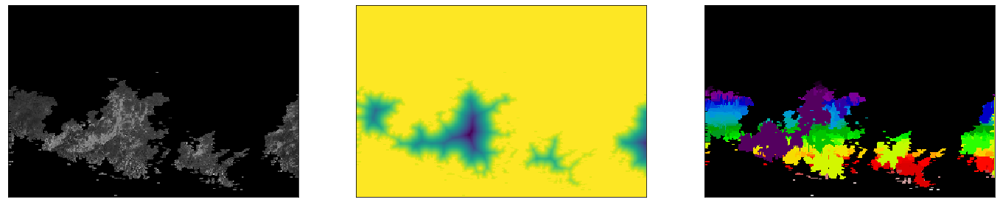

In [22]:
fig, axes = plt.subplots(figsize = (24, 5), nrows = 1, ncols = 3)

for i, (img_, cmap) in enumerate(zip([image, -distance, labels], ['gray', None, 'nipy_spectral'])):
    axes[i].imshow(img_, cmap = cmap, interpolation = 'nearest')
    axes[i].set(xticks = [], yticks = [])

In [23]:
img_orig = image_dicts['Dust.jpg']
img = ResizeImage(img_orig, 300, 0)
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCR_CB)

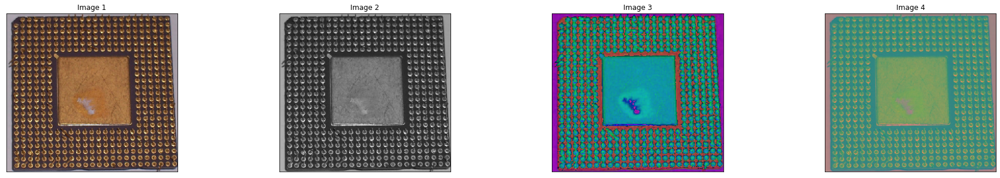

In [24]:
imShows([img, img_gray, img_hsv, img_ycrcb], rows = 1, cols = 4)

In [25]:
image = img_hsv[:,:,0].copy()
denoised = skiRank.median(image, skiDisk(2))

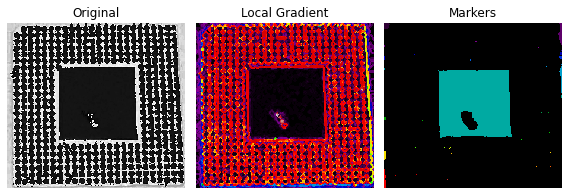

In [26]:
markers = skiRank.gradient(denoised, skiDisk(5)) < 10
markers = ndi.label(markers)[0]
# local gradient (disk(2) is used to keep edges thin)
gradient = skiRank.gradient(denoised, skiDisk(2))

# display results
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(8, 8),
                         sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray, interpolation='nearest')
ax[0].set_title("Original")

ax[1].imshow(gradient, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[1].set_title("Local Gradient")

ax[2].imshow(markers, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[2].set_title("Markers")

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

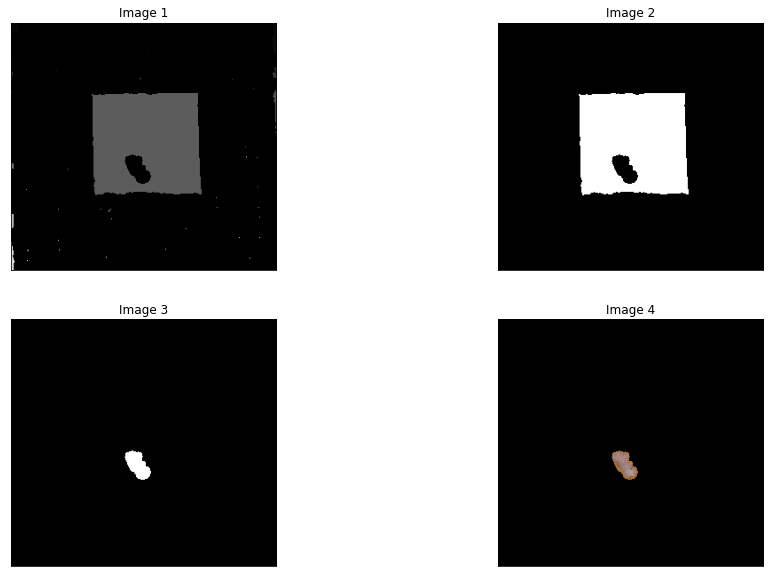

In [27]:
max_area = 0
ilabel = 0
for i in range(1, markers.max() + 1): # 0  is background not care in range
    area = (markers == i).sum()
    if(area > max_area):
        max_area = area
        ilabel = i

max_mask = (markers == ilabel).astype(int)
mask_to_process = fillHoles(max_mask) - max_mask
image_to_process = segmentColorImageByMask(img, mask_to_process)

imShows([markers, max_mask, mask_to_process, image_to_process], rows = 2, cols = 2)

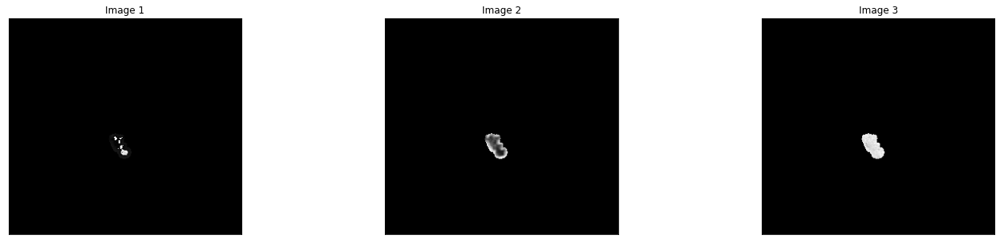

In [28]:
image_to_process = segmentColorImageByMask(img_hsv, mask_to_process)
imShows([image_to_process[:,:,0], image_to_process[:,:,1], image_to_process[:,:,2]], rows = 1, cols = 3)

In [29]:
image = image_to_process[:,:,1]
denoised = skiRank.median(image, skiDisk(2))

markers = skiRank.gradient(denoised, skiDisk(5)) < 10
markers = ndi.label(markers)[0]

gradient = skiRank.gradient(denoised, skiDisk(2))

labels = watershed(gradient, markers)

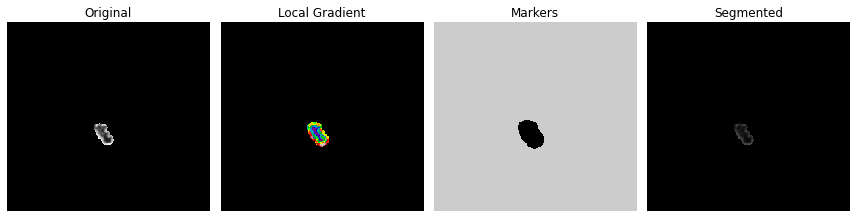

In [30]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(12, 12),
                         sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray, interpolation='nearest')
ax[0].set_title("Original")

ax[1].imshow(gradient, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[1].set_title("Local Gradient")

ax[2].imshow(markers, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[2].set_title("Markers")

ax[3].imshow(image, cmap=plt.cm.gray, interpolation='nearest')
ax[3].imshow(labels, cmap=plt.cm.nipy_spectral, interpolation='nearest', alpha=.7)
ax[3].set_title("Segmented")

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

### Đóng khung vị trí lỗi sau đó crop lỗi ra. Trên ảnh crop tiến hành resize cho nó bự ra và dùng watershed để phân tích các phần lõi và biên của lỗi

In [31]:
cropImg = img[140:190, 110:160, :].copy()
cropImg = ResizeImage(cropImg, 100, 0)

In [32]:
img_gray = cv2.cvtColor(cropImg, cv2.COLOR_RGB2GRAY)
img_hsv = cv2.cvtColor(cropImg, cv2.COLOR_RGB2HSV)
img_ycrcb = cv2.cvtColor(cropImg, cv2.COLOR_RGB2YCR_CB)

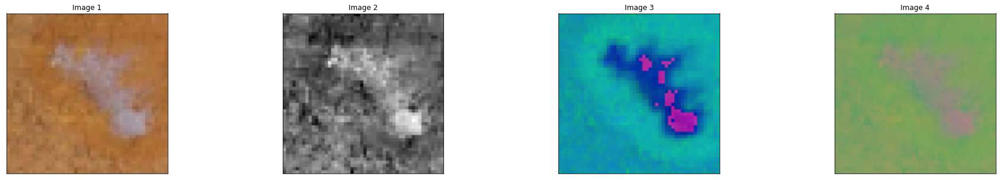

In [33]:
imShows([cropImg, img_gray, img_hsv, img_ycrcb], rows = 1, cols = 4)

In [34]:
image = img_hsv[:,:,0].copy()
denoised = skiRank.median(image, skiDisk(2))

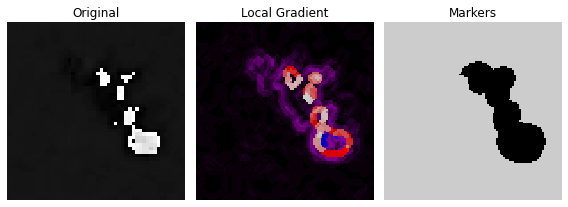

In [35]:
markers = skiRank.gradient(denoised, skiDisk(5)) < 15
markers = ndi.label(markers)[0]
# local gradient (disk(2) is used to keep edges thin)
gradient = skiRank.gradient(denoised, skiDisk(2))

# display results
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(8, 8),
                         sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray, interpolation='nearest')
ax[0].set_title("Original")

ax[1].imshow(gradient, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[1].set_title("Local Gradient")

ax[2].imshow(markers, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[2].set_title("Markers")

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

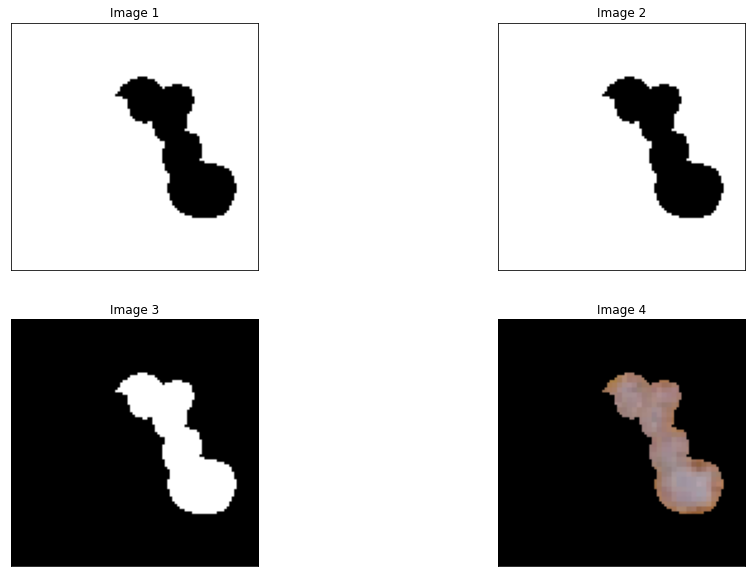

In [36]:
max_area = 0
ilabel = 0
for i in range(1, markers.max() + 1):
    area = (markers == i).sum()
    if(area > max_area):
        max_area = area
        ilabel = i

max_mask = (markers == ilabel).astype(int)
mask_to_process = fillHoles(max_mask) - max_mask
image_to_process = segmentColorImageByMask(cropImg, mask_to_process.astype(np.uint8))

imShows([markers, max_mask, mask_to_process, image_to_process], rows = 2, cols = 2)

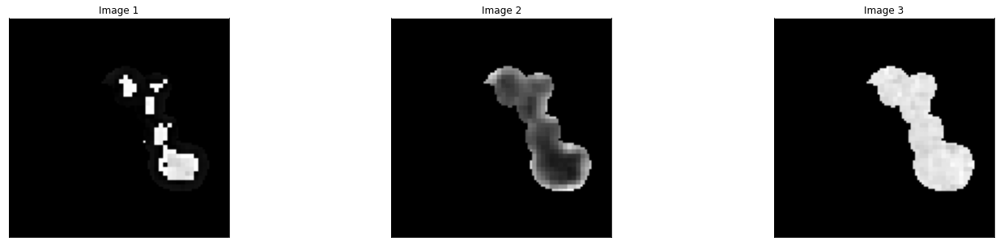

In [37]:
image_to_process = segmentColorImageByMask(img_hsv, mask_to_process)
imShows([image_to_process[:,:,0], image_to_process[:,:,1], image_to_process[:,:,2]], rows = 1, cols = 3)

In [38]:
image = image_to_process[:,:,1]
denoised = skiRank.median(image, skiDisk(2))

markers = skiRank.gradient(denoised, skiDisk(5)) < 10
markers = ndi.label(markers)[0]

gradient = skiRank.gradient(denoised, skiDisk(2))

labels = watershed(gradient, markers)

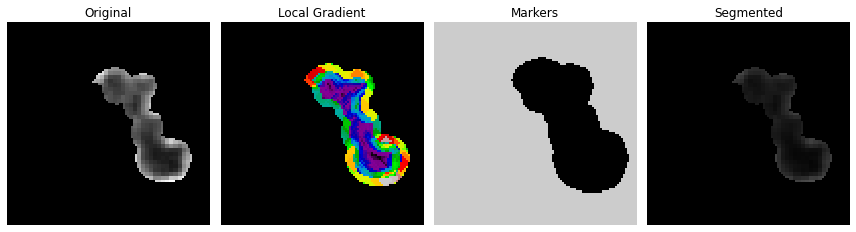

In [39]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(12, 12),
                         sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(image, cmap=plt.cm.gray, interpolation='nearest')
ax[0].set_title("Original")

ax[1].imshow(gradient, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[1].set_title("Local Gradient")

ax[2].imshow(markers, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[2].set_title("Markers")

ax[3].imshow(image, cmap=plt.cm.gray, interpolation='nearest')
ax[3].imshow(labels, cmap=plt.cm.nipy_spectral, interpolation='nearest', alpha=.7)
ax[3].set_title("Segmented")

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

## Split and Merging Regions

In [40]:
def _weight_mean_color(graph, src, dst, n):
    """Callback to handle merging nodes by recomputing mean color.

    The method expects that the mean color of `dst` is already computed.

    Parameters
    ----------
    graph : RAG
        The graph under consideration.
    src, dst : int
        The vertices in `graph` to be merged.
    n : int
        A neighbor of `src` or `dst` or both.

    Returns
    -------
    data : dict
        A dictionary with the `"weight"` attribute set as the absolute
        difference of the mean color between node `dst` and `n`.
    """

    diff = graph.nodes[dst]['mean color'] - graph.nodes[n]['mean color']
    diff = np.linalg.norm(diff)
    return {'weight': diff}


def merge_mean_color(graph, src, dst):
    """Callback called before merging two nodes of a mean color distance graph.

    This method computes the mean color of `dst`.

    Parameters
    ----------
    graph : RAG
        The graph under consideration.
    src, dst : int
        The vertices in `graph` to be merged.
    """
    graph.nodes[dst]['total color'] += graph.nodes[src]['total color']
    graph.nodes[dst]['pixel count'] += graph.nodes[src]['pixel count']
    graph.nodes[dst]['mean color'] = (graph.nodes[dst]['total color'] /
                                      graph.nodes[dst]['pixel count'])

In [41]:
img_orig = image_dicts['Shelf.jpg']
img = ResizeImage(img_orig, 300, 0)
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCR_CB)

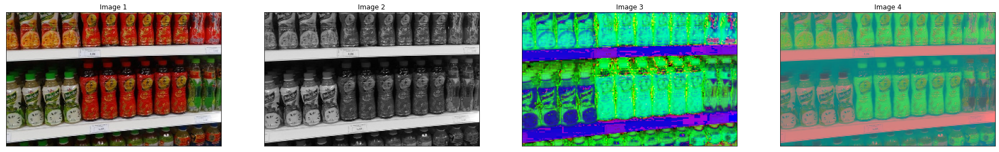

In [42]:
imShows([img, img_gray, img_hsv, img_ycrcb], rows = 1, cols = 4)

In [43]:
orig_labels = segmentation.slic(img, compactness = 30, n_segments = 400, start_label = 0)
g = graph.rag_mean_color(img, orig_labels)

merge_labels = graph.merge_hierarchical(orig_labels, g, thresh=35, rag_copy=False,
                                   in_place_merge=True,
                                   merge_func=merge_mean_color,
                                   weight_func=_weight_mean_color)

image_merge_labels = color.label2rgb(merge_labels, img, kind='avg', bg_label = 0)
image_merge_labels = segmentation.mark_boundaries(image_merge_labels, merge_labels, (0, 0, 0))

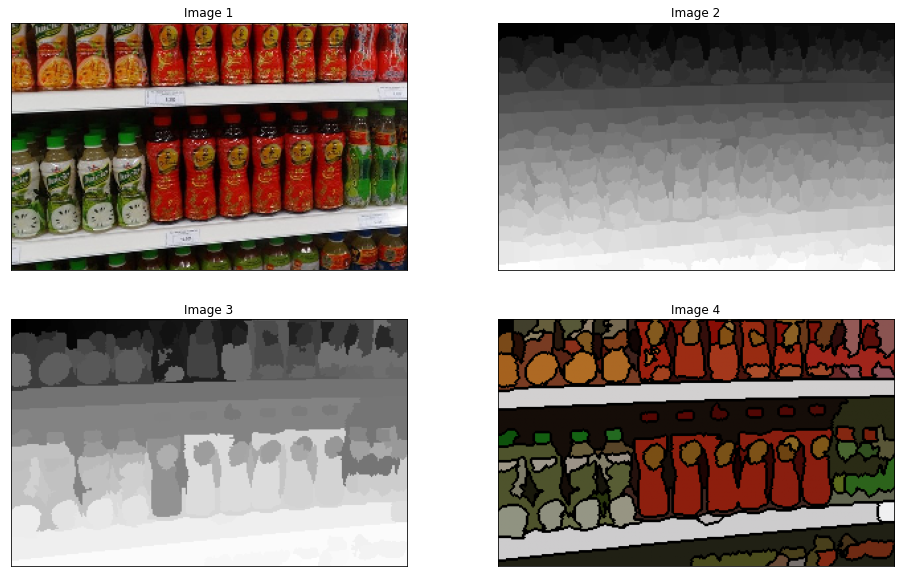

In [44]:
imShows([img, orig_labels, merge_labels, image_merge_labels], rows = 2, cols = 2)

In [45]:
rpoint = 120
cpoint = 110
img_select = img.copy()
result_label = merge_labels.copy()
cv2.circle(img_select,(cpoint,rpoint), 10, (0,0,255), -1)

idx = result_label[rpoint, cpoint]
orig_mask = result_label == idx
dilation_mask = cv2.dilate(orig_mask.astype(np.uint8), skiDisk(5))
fill_mask = fillHoles(dilation_mask)
max_mask = SelectLargestRegion(fill_mask)
image_max_mask = segmentColorImageByMask(img, max_mask)

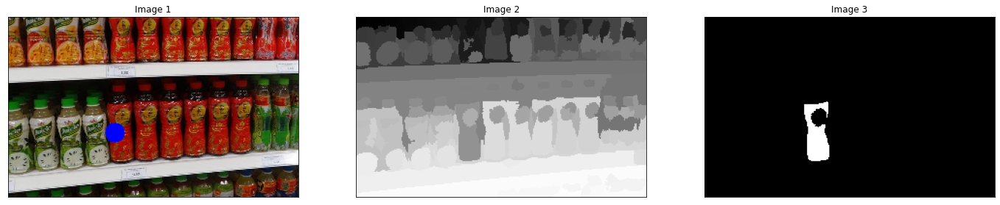

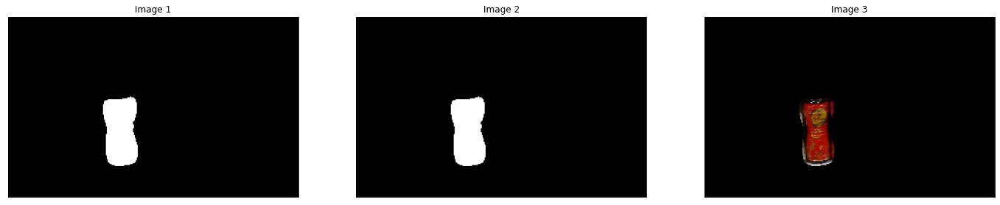

In [46]:
imShows([img_select, result_label, orig_mask], rows = 1, cols = 3)
imShows([fill_mask, max_mask, image_max_mask], rows = 1, cols = 3)

### Đóng khung vị trí lỗi sau đó crop lỗi ra. Trên anh crop tiến hành resize cho nó bự ra và dùng watershed để trích riêng từng chai nước Dr Thanh màu đỏ

In [47]:
cropImg = img_orig[130:300, 210:500, :].copy()
img = ResizeImage(cropImg, 300, 0)
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCR_CB)

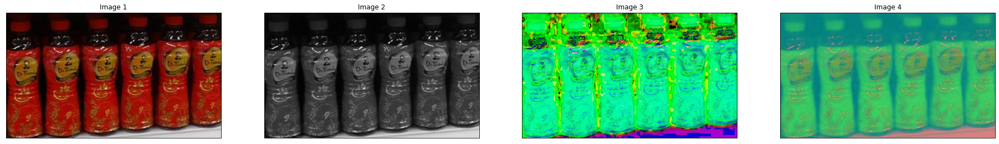

In [48]:
imShows([img, img_gray, img_hsv, img_ycrcb], rows = 1, cols = 4)

In [49]:
center, result_label, result_image = KMeansClustering(img_ycrcb, number_clusters = 2)
result_label = ReArrangeIndex(result_label)

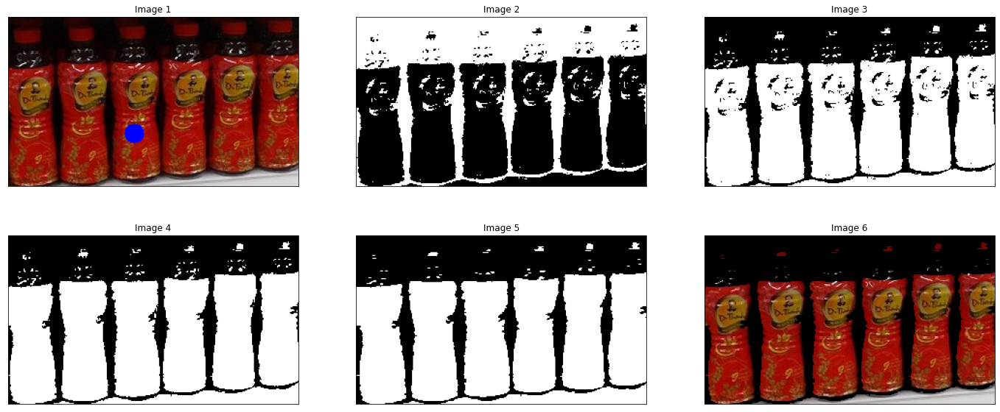

In [50]:
rpoint = 120
cpoint = 130
img_select = img.copy()
cv2.circle(img_select, (cpoint, rpoint), 10, (0, 0, 255), -1)

idx = result_label[rpoint, cpoint]
orig_mask = result_label == idx
fill_mask = fillHoles(orig_mask)
morph_mask = cv2.morphologyEx(fill_mask.astype(np.uint8), cv2.MORPH_OPEN, np.ones((1, 2)), iterations = 2)
image_morph_mask = segmentColorImageByMask(img, morph_mask)

imShows([img_select, result_label, orig_mask, fill_mask, morph_mask, image_morph_mask], rows = 2, cols = 3)

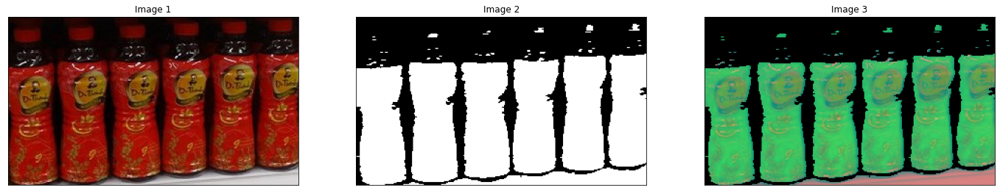

In [51]:
image_to_process = segmentColorImageByMask(img_ycrcb, morph_mask)
mask_to_process = morph_mask.copy()
imShows([img, mask_to_process, image_to_process], rows = 1, cols = 3)

In [52]:
image = image_to_process[:, :, 2].copy()
distance = ndi.distance_transform_edt(image)
local_maxi = peak_local_max(distance, indices = False, footprint = np.ones((3, 3)), labels = image)
markers = ndi.label(local_maxi)[0]
labels = watershed(-distance, markers, mask = image)

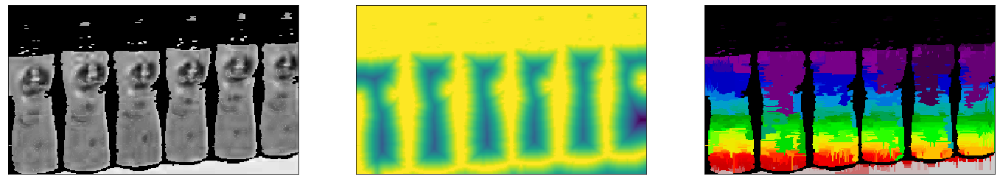

In [53]:
fig, axes = plt.subplots(figsize = (24, 5), nrows = 1, ncols = 3)

for i, (img_, cmap) in enumerate(zip([image, -distance, labels], ['gray', None, 'nipy_spectral'])):
    axes[i].imshow(img_, cmap = cmap, interpolation = 'nearest')
    axes[i].set(xticks = [], yticks = [])

## 2/ Chọn thêm 2 ví dụ khác trong danh sách hình và định nghĩa object cần segment trong các hình là gì và thực hiện segmentation tốt nhất bằng watershed và merging regions 

## a) Gesture.jpg
## Object cần segment: Bàn tay

In [54]:
img_orig = image_dicts['Gesture.jpg']
img = ResizeImage(img_orig, 300, 0)
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCR_CB)

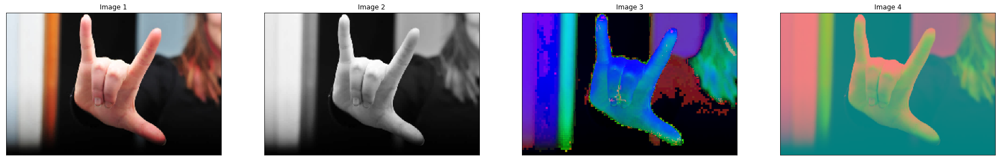

In [55]:
imShows([img, img_gray, img_hsv, img_ycrcb], rows = 1, cols = 4)

In [56]:
orig_labels = segmentation.slic(img, compactness = 30, n_segments = 5, start_label = 0)
g = graph.rag_mean_color(img, orig_labels)

merge_labels = graph.merge_hierarchical(
    orig_labels, g, thresh = 10, rag_copy = False,
    in_place_merge = True, merge_func = merge_mean_color,
    weight_func = _weight_mean_color
)
image_merge_labels = color.label2rgb(merge_labels, img, kind = 'avg', bg_label = 0)
image_merge_labels = segmentation.mark_boundaries(image_merge_labels, merge_labels, (0, 0, 0))

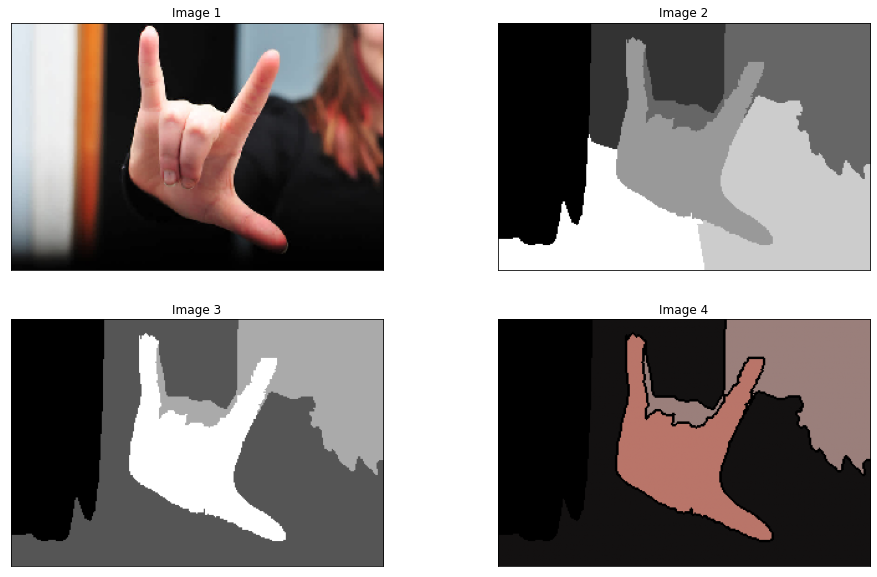

In [57]:
imShows([img, orig_labels, merge_labels, image_merge_labels], rows = 2, cols = 2)

In [58]:
rpoint = 120
cpoint = 110
img_select = img.copy()
result_label = merge_labels.copy()
cv2.circle(img_select,(cpoint,rpoint), 10, (0,0,255), -1)

idx = result_label[rpoint, cpoint]
orig_mask = result_label == idx
dilation_mask = cv2.dilate(orig_mask.astype(np.uint8), skiDisk(5))
fill_mask = fillHoles(dilation_mask)
max_mask = SelectLargestRegion(fill_mask)
image_max_mask = segmentColorImageByMask(img, max_mask)

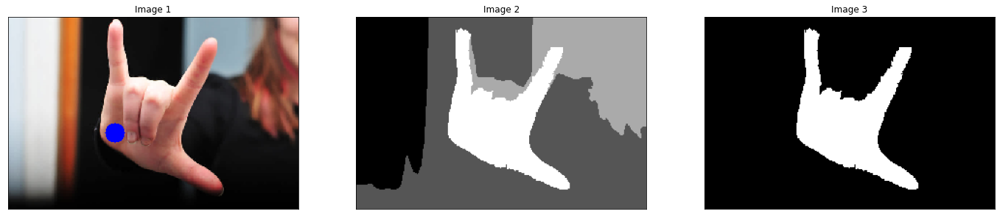

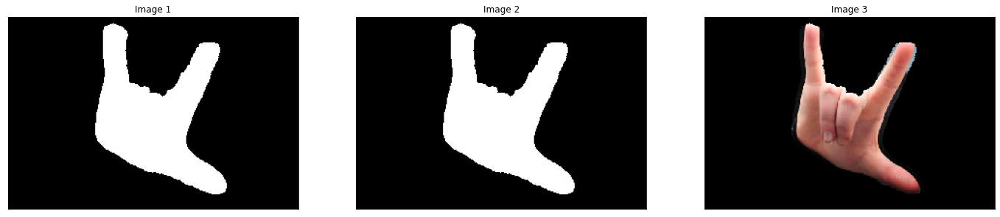

In [59]:
imShows([img_select, result_label, orig_mask], rows = 1, cols = 3)
imShows([fill_mask, max_mask, image_max_mask], rows = 1, cols = 3)

## b) Mask.jpg
## Object cần segment: Các khẩu trang có trong bức ảnh

In [60]:
img_orig = image_dicts['Mask.jpg']
img = ResizeImage(img_orig, 300, 0)
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCR_CB)

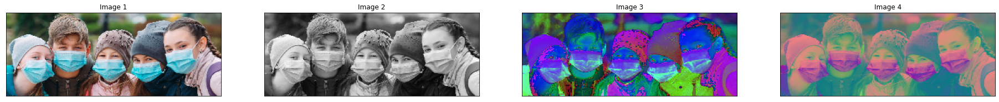

In [61]:
imShows([img, img_gray, img_hsv, img_ycrcb], rows = 1, cols = 4)

In [62]:
orig_labels = segmentation.slic(img, compactness = 30, n_segments = 50, start_label = 0)
g = graph.rag_mean_color(img, orig_labels)

merge_labels = graph.merge_hierarchical(
    orig_labels, g, thresh = 50, rag_copy = False,
    in_place_merge = True, merge_func = merge_mean_color,
    weight_func = _weight_mean_color
)
image_merge_labels = color.label2rgb(merge_labels, img, kind = 'avg', bg_label = 0)
image_merge_labels = segmentation.mark_boundaries(image_merge_labels, merge_labels, (0, 0, 0))
result_label = merge_labels.copy()

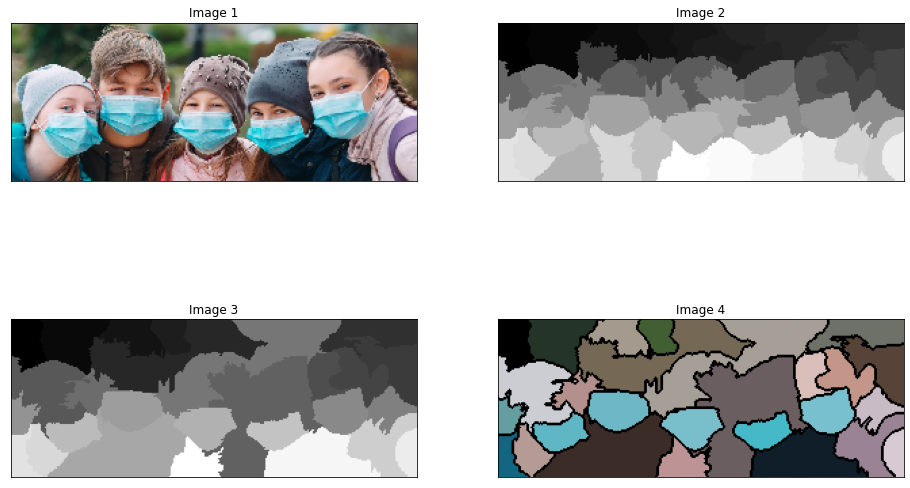

In [63]:
imShows([img, orig_labels, merge_labels, image_merge_labels], rows = 2, cols = 2)

In [64]:
rPoints, cPoints = [80, 60, 80, 80, 80], [50, 80, 150, 200, 250]

In [65]:
mask = np.zeros(img.shape[:2], dtype = np.uint8)
for r, c in zip(rPoints, cPoints):
    idx = result_label[r, c]
    mask += (result_label == idx).astype(np.uint8)

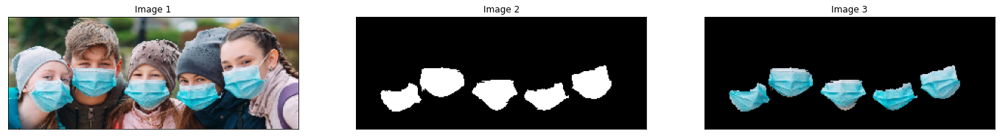

In [66]:
Masks = segmentColorImageByMask(img, mask)
imShows([img, mask, Masks], rows = 1, cols = 3)

## --------------------------------------------- Làm thêm ---------------------------------------------

## c) Leaf.jpg
## Object cần segment: Lá

In [67]:
img_orig = image_dicts['Leaf.jpg']
img = ResizeImage(img_orig, 300, 0)
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCR_CB)

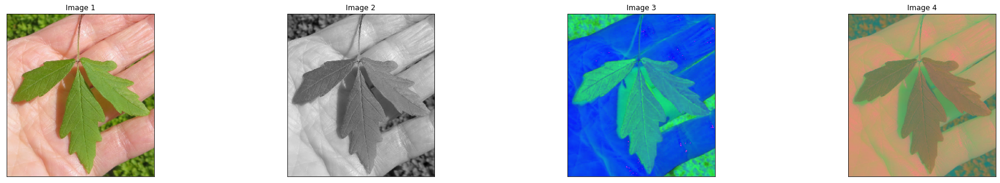

In [68]:
imShows([img, img_gray, img_hsv, img_ycrcb], rows = 1, cols = 4)

In [69]:
orig_labels = segmentation.slic(img, compactness = 50, n_segments = 1000, start_label = 0)
g = graph.rag_mean_color(img, orig_labels)

merge_labels = graph.merge_hierarchical(
    orig_labels, g, thresh = 50, rag_copy = False,
    in_place_merge = True, merge_func = merge_mean_color,
    weight_func = _weight_mean_color
)
image_merge_labels = color.label2rgb(merge_labels, img, kind = 'avg', bg_label = 0)
image_merge_labels = segmentation.mark_boundaries(image_merge_labels, merge_labels, (0, 0, 0))

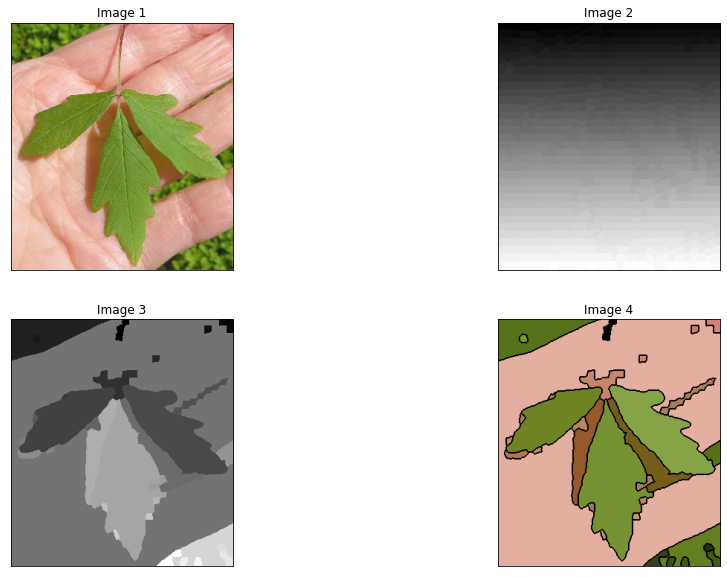

In [70]:
imShows([img, orig_labels, merge_labels, image_merge_labels], rows = 2, cols = 2)

In [71]:
rPoints = [150, 200, 150]
cPoints = [50, 150, 200]

In [72]:
mask = np.zeros(merge_labels.shape, dtype = np.uint8)
for (r, c) in zip(rPoints, cPoints):
    idx = merge_labels[r, c]
    mask += (merge_labels == idx)
mask = mask.astype(np.uint8)
leaf = segmentColorImageByMask(img, mask)

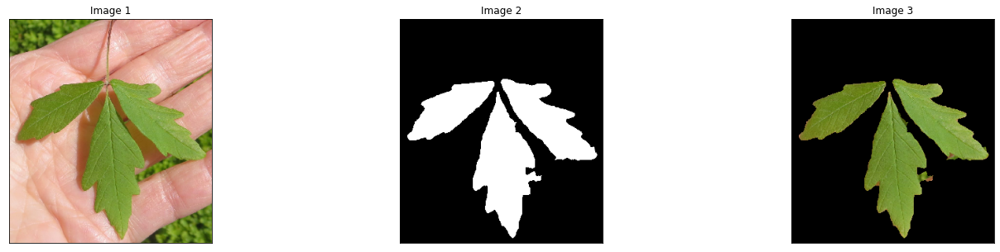

In [73]:
imShows([img, mask, leaf], rows = 1, cols = 3)

## d) Emotion.jpg
## Object cần segment: Biểu cảm khuôn mặt

In [74]:
img_orig = image_dicts['Emotion.jpg']
img = ResizeImage(img_orig, 300, 0)
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_RGB2YCR_CB)

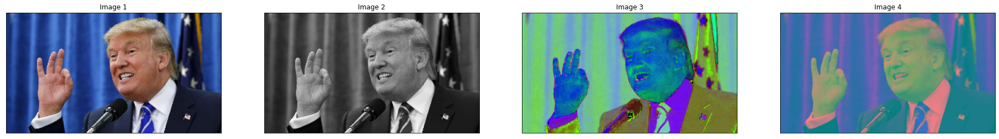

In [75]:
imShows([img, img_gray, img_hsv, img_ycrcb], rows = 1, cols = 4)

In [76]:
orig_labels = segmentation.slic(img, compactness = 30, n_segments = 7, start_label = 0)
g = graph.rag_mean_color(img, orig_labels)

merge_labels = graph.merge_hierarchical(
    orig_labels, g, thresh = 50, rag_copy = False,
    in_place_merge = True, merge_func = merge_mean_color,
    weight_func = _weight_mean_color
)
image_merge_labels = color.label2rgb(merge_labels, img, kind = 'avg', bg_label = 0)
image_merge_labels = segmentation.mark_boundaries(image_merge_labels, merge_labels, (0, 0, 0))

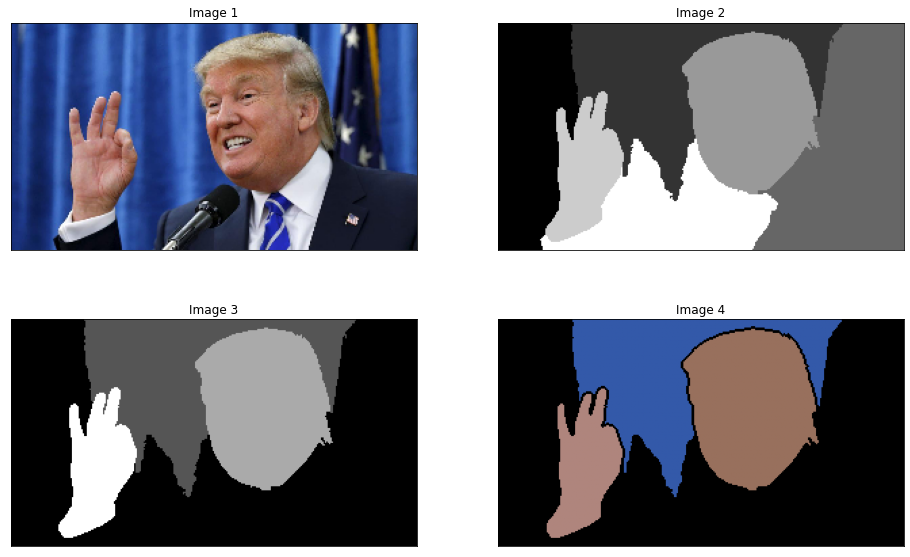

In [77]:
imShows([img, orig_labels, merge_labels, image_merge_labels], rows = 2, cols = 2)

In [78]:
rPoint, cPoint = 60, 200
idx = merge_labels[rPoint, cPoint]
mask = (merge_labels == idx).astype(np.uint8)
emotion = segmentColorImageByMask(img, mask)

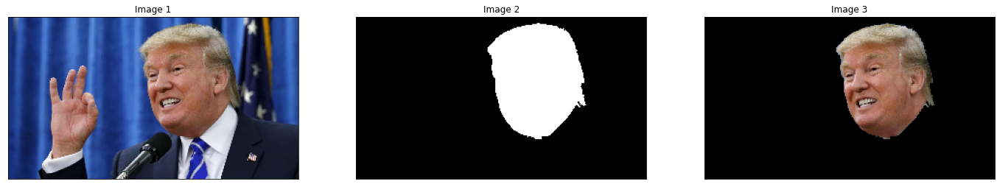

In [79]:
imShows([img, mask, emotion], rows = 1, cols = 3)

## e) Melanoma.jpg
## Object cần segment: Vết melanoma

In [80]:
img_orig = image_dicts['Melanoma.jpg']
img_gray = cv2.cvtColor(img_orig, cv2.COLOR_RGB2GRAY)
img_hsv = cv2.cvtColor(img_orig, cv2.COLOR_RGB2HSV)
img_ycrcb = cv2.cvtColor(img_orig, cv2.COLOR_RGB2YCR_CB)

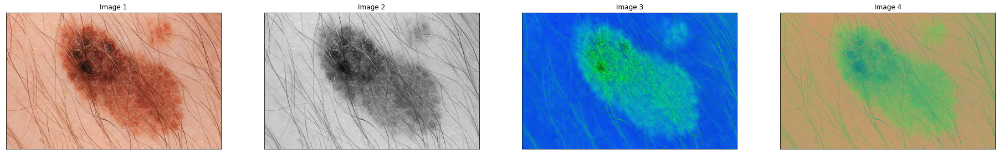

In [81]:
imShows([img_orig, img_gray, img_hsv, img_ycrcb], rows = 1, cols = 4)

In [82]:
orig_labels = segmentation.slic(img_orig, compactness = 20, n_segments = 5, start_label = 0)
g = graph.rag_mean_color(img_orig, orig_labels)

merge_labels = graph.merge_hierarchical(
    orig_labels, g, thresh = 50, rag_copy = False,
    in_place_merge = True, merge_func = merge_mean_color,
    weight_func = _weight_mean_color
)
image_merge_labels = color.label2rgb(merge_labels, img_orig, kind = 'avg', bg_label = 0)
image_merge_labels = segmentation.mark_boundaries(image_merge_labels, merge_labels, (0, 0, 0))

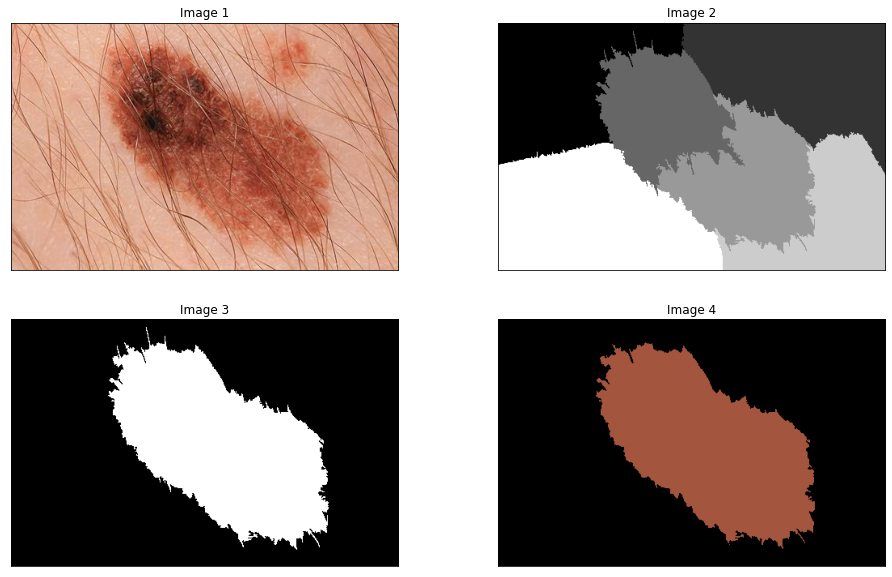

In [83]:
imShows([img_orig, orig_labels, merge_labels, image_merge_labels], rows = 2, cols = 2)

In [84]:
rPoint, cPoint = 100, 200
idx = merge_labels[rPoint, cPoint]
mask = (merge_labels == idx).astype(np.uint8)
melanoma = segmentColorImageByMask(img_orig, mask)

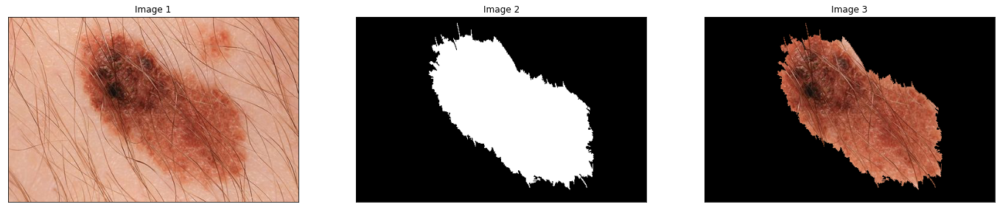

In [85]:
imShows([img_orig, mask, melanoma], rows = 1, cols = 3)